# Spotify Challenge - Clustering songs- Unsupervised Learning

🎯 The goal of this recap is to **cluster songs** using the **KMeans _(clustering algorithm)_** with a **PCA _(dimensionality reduction)_**

In [64]:
# Data Manipulation
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

# Data Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Pipeline and Column Transformers
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn import set_config
set_config(display = "diagram")

# Scaling
from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler

# Cross Validation
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_predict

# Unsupervised Learning
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# STATISTICS
from statsmodels.graphics.gofplots import qqplot
# This function plots your sample against a Normal distribution,
# to see whether your sample is normally distributed or not


## (1) The Spotify Dataset

In [33]:
from sklearn.utils import shuffle

spotify = shuffle(pd.read_csv('https://wagon-public-datasets.s3.amazonaws.com/Machine%20Learning%20Datasets/ML_spotify_data.csv'))
spotify.head()


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo
1903,Murió Mi Padre,['Conjunto Primavera'],22,0.621,0.843,0.621,0,2,0.1880,-7.477,0.0300,110.457
1711,Outside My Window,['Stevie Wonder'],26,0.717,0.711,0.530,0,6,0.2370,-16.112,0.0375,114.405
5772,The Rain,['Joe Hisaishi'],42,0.374,0.104,0.179,0,9,0.1520,-17.842,0.0385,76.532
9838,Stay Ur Distance,['Yo Gotti'],64,0.832,0.682,0.611,1,0,0.2160,-7.337,0.1930,139.933
8164,No Ordinary Love - Remastered,['Sade'],53,0.619,0.765,0.486,0,11,0.0918,-10.421,0.0396,166.146


### (1.1) Basic Info

In [34]:
spotify.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 1903 to 5626
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   name          10000 non-null  object 
 1   artists       10000 non-null  object 
 2   popularity    10000 non-null  int64  
 3   danceability  10000 non-null  float64
 4   valence       10000 non-null  float64
 5   energy        10000 non-null  float64
 6   explicit      10000 non-null  int64  
 7   key           10000 non-null  int64  
 8   liveness      10000 non-null  float64
 9   loudness      10000 non-null  float64
 10  speechiness   10000 non-null  float64
 11  tempo         10000 non-null  float64
dtypes: float64(7), int64(3), object(2)
memory usage: 1015.6+ KB


### (1.2) Working on the numerical features

🔢  Let's focus on the numerical features. Store the numerical features in a variable called `spotify_num`

In [35]:
spotify_num = spotify.select_dtypes(exclude = ['object'])
spotify_num


,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo
1903,22,0.621,0.843,0.621,0,2,0.1880,-7.477,0.0300,110.457
1711,26,0.717,0.711,0.530,0,6,0.2370,-16.112,0.0375,114.405
5772,42,0.374,0.104,0.179,0,9,0.1520,-17.842,0.0385,76.532
9838,64,0.832,0.682,0.611,1,0,0.2160,-7.337,0.1930,139.933
8164,53,0.619,0.765,0.486,0,11,0.0918,-10.421,0.0396,166.146
...,...,...,...,...,...,...,...,...,...,...
5503,33,0.708,0.469,0.615,1,1,0.6260,-9.574,0.2720,78.309
1582,19,0.791,0.366,0.334,0,9,0.0979,-12.066,0.1620,77.856
4455,36,0.614,0.269,0.352,0,7,0.1090,-11.684,0.0276,128.080
4245,25,0.652,0.494,0.471,0,11,0.1160,-10.216,0.0267,104.422


### (1.3) Correlations between features

❓ Visualize the correlation matrix (`PuRd` is a nice cmap choice)

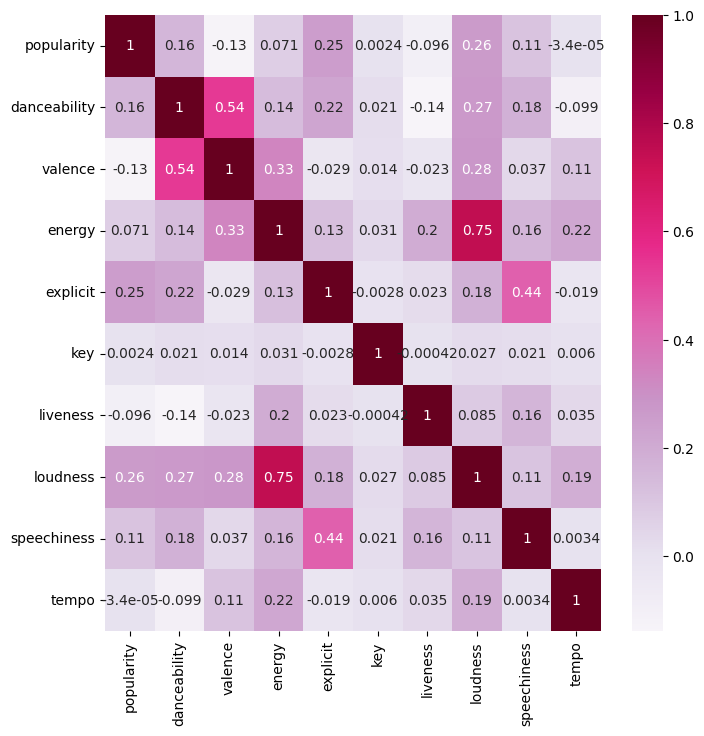

In [36]:
plt.figure(figsize=(8,8))

sns.heatmap(spotify_num.corr(),
            annot = True,
            annot_kws = {"fontsize":10},
            cmap='PuRd');


In [37]:
spotify_num.columns


Index(['popularity', 'danceability', 'valence', 'energy', 'explicit', 'key',
       'liveness', 'loudness', 'speechiness', 'tempo'],
      dtype='object')

### (1.4) 3D Visualisation

🎨 Let's select 3 features of these songs and visualise them in a 3D-scatter-plot using `plotly` (📚 [plotly.express.scatter_3d](https://plotly.com/python-api-reference/generated/plotly.express.scatter_3d))

In [38]:
fig = px.scatter_3d(spotify_num,
                    x = 'danceability',
                    y = 'energy',
                    z = 'speechiness',
                    opacity=0.7, width=500, height=500
           )
fig.show()


🎯 _Remember: our goal is to cluster these songs_

## (2) Unsupervised Learning: Clustering

### (2.1) Vanilla KMeans

💫 Let's try our first _Unsupervised Algorithm_ 

❓ Fit a `kmeans_vanilla` model directly on our `spotify_num`, keeping default number of clusters
- Store its predicted labels in a variable called `labels_vanilla`

In [39]:
kmeans_vanilla = KMeans(n_clusters = 8)
kmeans_vanilla.fit(spotify_num)

labels_vanilla = kmeans_vanilla.labels_
labels_vanilla


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



array([1, 4, 7, ..., 4, 1, 1], dtype=int32)

In [40]:
fig = px.scatter_3d(spotify_num,
                    x = 'danceability',
                    y = 'energy',
                    z = 'speechiness',
                    color = labels_vanilla, width=500, height=500)
fig.show()


😭 It doesn't look good at all... who would pay 10-15 euros a month to Spotify, Apple Music, Deezer, Amazon Music or Tidal for that ?

### (2.2) Scaling + KMeans

🪜 Remember that the KMeans is a distance-based algorithm and that for any Machine Learning model, we should scale the features so that they start with an "equal chance" of impacting the predictions.

❓ Let's take a short approach to scaling and Robust-Scale everything. 

In [41]:
scaler = RobustScaler()
spotify_scaled = pd.DataFrame(scaler.fit_transform(spotify_num), columns=spotify_num.columns)
spotify_scaled


,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo
0,-0.736842,0.254980,0.742424,0.012920,0.0,-0.428571,0.352555,0.204732,-0.349537,-0.181341
1,-0.526316,0.637450,0.434732,-0.222222,0.0,0.142857,0.645354,-1.171035,-0.175926,-0.090411
2,0.315789,-0.729084,-0.980186,-1.129199,0.0,0.571429,0.137437,-1.446666,-0.152778,-0.962694
3,1.473684,1.095618,0.367133,-0.012920,1.0,-0.714286,0.519869,0.227037,3.423611,0.497544
4,0.894737,0.247012,0.560606,-0.335917,0.0,0.857143,-0.222289,-0.264319,-0.127315,1.101277
...,...,...,...,...,...,...,...,...,...,...
9995,-0.157895,0.601594,-0.129371,-0.002584,1.0,-0.571429,2.969824,-0.129371,5.252315,-0.921767
9996,-0.894737,0.932271,-0.369464,-0.728682,0.0,0.571429,-0.185838,-0.526408,2.706019,-0.932200
9997,0.000000,0.227092,-0.595571,-0.682171,0.0,0.285714,-0.119510,-0.465546,-0.405093,0.224548
9998,-0.578947,0.378486,-0.071096,-0.374677,0.0,0.857143,-0.077682,-0.231658,-0.425926,-0.320338


❓ Fit the same default KMeans model number and compare results visually

In [42]:
kmeans_scaled = KMeans(n_clusters = 8)
kmeans_scaled.fit(spotify_scaled)


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans()

In [43]:
labels_scaled = kmeans_scaled.labels_
labels_scaled


array([3, 3, 4, ..., 3, 3, 1], dtype=int32)

🧪Okay, our songs'clustering look better even if we can't rival yet with the datascience team at Spotify!

In [44]:
fig_scaled = px.scatter_3d(spotify_scaled,
                           x = 'danceability',
                           y = 'energy',
                           z = 'speechiness',
                           color = labels_scaled,
                           width=500, height=500)
fig_scaled.show()


🤪 It is a bit better but still messy...besides, we are only looking at one specific 3D slice of our dataset here!

### (2.3) Scaling + PCA + KMeans

🧑🏻‍🏫 What if we perform a PCA before running our clustering algorithm ? We could:
* reduce dimensionality to get a better visual feedback on our clustering
* use the orthogonality of the principal components so that the KMeans algorithm increases its clustering power

❓ Fit a PCA and reduce the dimensionality appropriately using the elbow method

In [45]:
pca = PCA()
pca.fit(spotify_scaled) # find all the Principal Components PC (no y!)


PCA()

❓ Project your $ 10000 \times 10$ `spotify_num_scaled` dataset into this new space with the number of principal components you decided to keep. Name it `spotify_proj`

In [46]:
threhsold_pca = 3
pca = PCA(n_components=threhsold_pca, whiten=True)
pca.fit(spotify_scaled)
spotify_proj = pd.DataFrame(pca.transform(spotify_scaled))
spotify_proj


,0,1,2
0,-0.499231,0.091038,-0.499489
1,-0.438478,0.004970,0.465772
2,-0.511415,-0.589704,1.753648
3,1.170322,-0.325760,-0.872106
4,-0.423071,-0.535972,-0.588203
...,...,...,...
9995,1.996819,1.471675,0.741495
9996,0.734577,-1.000726,0.637401
9997,-0.571765,-0.535330,0.320789
9998,-0.566900,-0.424406,0.026410


In [47]:
fig_scaled = px.scatter_3d(spotify_proj, x = 0, y = 1, z = 2, opacity=0.7, width=500, height=500)
fig_scaled.show()


❓ Let's try a KMeans now and save the labels into `labels_kmeans_pca`

In [48]:
kmeans_pca = KMeans(n_clusters = 8)
kmeans_pca.fit(spotify_proj)
labels_kmeans_pca = kmeans_pca.labels_
labels_kmeans_pca


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



array([7, 7, 6, ..., 7, 7, 1], dtype=int32)

In [49]:
fig_scaled = px.scatter_3d(spotify_scaled,
                           x = 'danceability',
                           y = 'energy',
                           z = 'speechiness',
                           color = labels_kmeans_pca,
                          width=500, height=500)
fig_scaled.show()


### (2.4) Ideal number of clusters ? 

<details>
    <summary><i>Are there some number of clusters useless to try ? </i></summary>

* $K = 1$ means that you would have only 1 cluster with the whole dataset of $10000$ songs
* $K = 10000$ means that each of the $10000$ songs would be its own cluster!
* $K = 2$ means that you would have only 2 clusters with $5000$ songs each...
    
        
</details>        

In [50]:
nb_clusters_to_try = np.arange(1,20+1,1)
nb_clusters_to_try


array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20])

❓ How would you decide on the number of clusters to use ❓

<details>
    <summary markdown='span'>Answer</summary>

Compare each model's inertia:
    
= Sum of Squared Residuals of each observation to their closest centroids  
= Sum of Within-Cluster Sum of Squares (WCSS)

$ inertia = \sum_{j=1}^{K} \sum_{x_i \in C_j} || x_i - \mu_j ||^2$

where:
* $K$ = number of clusters
* $C_j$ = cluster $j$
</details>

In [51]:
# Apply the elbow method to find the optimal number of clusters.

wcss = []

for K in nb_clusters_to_try:
    print('working with ' + str(K) + ' clusters...', flush=True)
    kmeans = KMeans(n_clusters = K)
    kmeans.fit(spotify_proj)
    wcss.append(kmeans.inertia_)
print("DONE !")


working with 1 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 2 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 3 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 4 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 5 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 6 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 7 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 8 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 9 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 10 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 11 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 12 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 13 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 14 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 15 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 16 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 17 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 18 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 19 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



working with 20 clusters...


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



DONE !


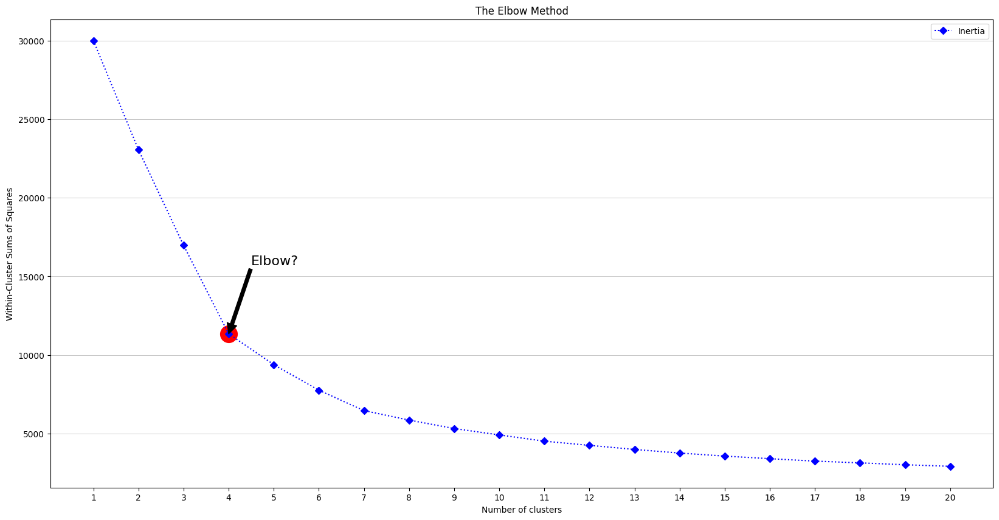

In [52]:
elbow_highlight = 4
with plt.style.context('seaborn-deep'):
    # figsize
    plt.figure(figsize=(20,10))
    # getting axes
    ax = plt.gca()
    # plotting
    ax.plot(nb_clusters_to_try, wcss,color="blue",linestyle=":",marker="D",label="Inertia")
    # customizing
    ax.legend(loc="upper right")
    ax.set_title('The Elbow Method')
    ax.set_xticks(nb_clusters_to_try)
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Within-Cluster Sums of Squares')
    ax.scatter(elbow_highlight,wcss[elbow_highlight-1],c='red',s=400)
    # annotate
    ax.annotate("Elbow?",
                (elbow_highlight,wcss[elbow_highlight-1]),
                (elbow_highlight+0.50,wcss[elbow_highlight-1]+5000),
                arrowprops=dict(facecolor='black'),
                fontsize=16,
#                horizontalalignment='middle',
                verticalalignment='top')

    ax.grid(axis="y",linewidth=0.5)
    plt.show()


### (2.5) Spotify : 6 daily mixes

🎵 If you are a Spotify user, you may have noticed that they offer you 6 daily mixes... So even if your previous elbow was not located at $K = 6$, let's try this value as the number of clusters!

In [53]:
spotify_clusters = 6

print('Working with ' + str(spotify_clusters) + ' clusters as in Spotify', flush=True)
print("-"*80)

kmeans = KMeans(n_clusters = spotify_clusters, max_iter = 300)

kmeans.fit(spotify_proj)

labelling = kmeans.labels_

fig_scaled = px.scatter_3d(spotify_proj,
                           x = 0,
                           y = 1,
                           z = 2,
                           color=labelling,
                           width=500,
                           height=500)
fig_scaled.show()


Working with 6 clusters as in Spotify
--------------------------------------------------------------------------------


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [54]:
spotify_labelled = pd.concat([spotify,pd.Series(labelling)],axis=1).rename(columns={0:"label"})
spotify_labelled


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
1903,Murió Mi Padre,['Conjunto Primavera'],22,0.621,0.843,0.621,0,2,0.1880,-7.477,0.0300,110.457,0
1711,Outside My Window,['Stevie Wonder'],26,0.717,0.711,0.530,0,6,0.2370,-16.112,0.0375,114.405,0
5772,The Rain,['Joe Hisaishi'],42,0.374,0.104,0.179,0,9,0.1520,-17.842,0.0385,76.532,0
9838,Stay Ur Distance,['Yo Gotti'],64,0.832,0.682,0.611,1,0,0.2160,-7.337,0.1930,139.933,3
8164,No Ordinary Love - Remastered,['Sade'],53,0.619,0.765,0.486,0,11,0.0918,-10.421,0.0396,166.146,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5503,Boo Boo’n,['Devin The Dude'],33,0.708,0.469,0.615,1,1,0.6260,-9.574,0.2720,78.309,0
1582,Don't Let Go - Bonus Track,"['Jerry Garcia Band', 'Jerry Garcia']",19,0.791,0.366,0.334,0,9,0.0979,-12.066,0.1620,77.856,0
4455,Do You Dream Of Me,['Michael W. Smith'],36,0.614,0.269,0.352,0,7,0.1090,-11.684,0.0276,128.080,0
4245,Midnight Radio,['Big Head Todd and The Monsters'],25,0.652,0.494,0.471,0,11,0.1160,-10.216,0.0267,104.422,0


In [55]:
np.unique(labelling)


array([0, 1, 2, 3, 4, 5], dtype=int32)

In [56]:
spotify_labelled.label.value_counts()


0    4196
3    3101
1     885
5     882
2     870
4      66
Name: label, dtype: int64

In [57]:
daily_mixes = {}

for numero_cluster in np.unique(labelling):
    daily_mixes[numero_cluster] = spotify_labelled[spotify_labelled.label == numero_cluster]


In [58]:
for key,value in daily_mixes.items():
    print("-"*50)
    print(f"Here are some songs for the playlist number {key}")
    print("-"*50)
    display(value.sample(20))


--------------------------------------------------
Here are some songs for the playlist number 0
--------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
4263,Weak (A Cappella),['SWV'],30,0.498,0.658,0.107,0,7,0.1600,-14.173,0.1210,127.148,0
7801,Im a Dog (feat. Gucci Mane),"['D.G. Yola', 'Gucci']",42,0.813,0.683,0.559,1,1,0.1440,-8.304,0.2070,143.980,0
7332,The Past Is A Grotesque Animal,['of Montreal'],45,0.454,0.399,0.944,0,5,0.5650,-4.855,0.0434,153.007,0
8368,Makeshift Chemistry,['Crown The Empire'],45,0.525,0.461,0.958,0,8,0.3910,-3.642,0.0653,120.060,0
1271,Sugaree - Live,"['Jerry Garcia Band', 'Jerry Garcia']",19,0.712,0.534,0.263,0,4,0.7100,-16.610,0.0336,113.496,0
9721,Velitas,"['Darell', 'Brytiago']",72,0.819,0.622,0.596,1,2,0.1380,-7.009,0.3180,165.951,0
2955,The Price Of Love,['Bon Jovi'],31,0.465,0.596,0.921,0,2,0.0552,-4.727,0.0665,143.236,0
8113,Blue Monday - 2011 Total Version,['New Order'],52,0.792,0.849,0.713,0,0,0.0855,-9.199,0.0539,130.418,0
4264,"You're the One for Me, Fatty - 2014 Remaster",['Morrissey'],29,0.523,0.753,0.870,0,7,0.0744,-5.646,0.0452,139.385,0
3144,Hard Times,['Cro-Mags'],25,0.460,0.102,0.980,0,9,0.1790,-4.642,0.1720,106.675,0


--------------------------------------------------
Here are some songs for the playlist number 1
--------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
7224,Ocean Breathes Salty,"[""Pickin' On Series"", 'Iron Horse']",40,0.630,0.8810,0.7890,0,7,0.3040,-8.001,0.0271,128.695,1
2797,Killing Time,['Triumph'],25,0.332,0.3410,0.8130,0,4,0.1570,-4.036,0.0392,137.442,1
1522,איך שיר נולד,"['Yehonatan Geffen', 'Yoni Rechter', 'Gidi Gov...",37,0.725,0.5090,0.3250,0,7,0.0577,-16.342,0.1780,116.615,1
4212,Chains Around My Heart,['Richard Marx'],38,0.481,0.1150,0.4670,0,6,0.1300,-10.442,0.0292,81.054,1
8673,He'e Roa,['Kolohe Kai'],49,0.836,0.8760,0.5440,0,10,0.0967,-6.588,0.0532,129.979,1
917,Good Company - Remastered 2011,['Queen'],20,0.500,0.5100,0.4180,0,6,0.3460,-11.277,0.0444,183.067,1
5474,Walkaway,['Thomas Newman'],39,0.211,0.0661,0.0166,0,5,0.0907,-31.533,0.0413,63.128,1
385,Se bruciasse la città,['Massimo Ranieri'],18,0.454,0.5970,0.8300,0,4,0.1660,-7.984,0.1200,112.112,1
142,Human Race,['Human Race'],24,0.737,0.4530,0.5380,0,8,0.1050,-9.414,0.0421,100.018,1
5967,You Can Do It,"['Ice Cube', 'Mack 10', 'Ms. Toi']",44,0.947,0.8870,0.8530,1,1,0.0502,-4.489,0.1640,99.887,1


--------------------------------------------------
Here are some songs for the playlist number 2
--------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
4539,Il barbiere di Siviglia (The Barber of Seville...,"['Gioachino Rossini', 'Roberto Servile', 'Soni...",42,0.400,0.4400,0.312,0,0,0.2500,-17.376,0.1570,76.211,2
3716,Oh My Darling Clementine,['Freddy Quinn'],35,0.636,0.4900,0.363,0,7,0.0990,-11.625,0.0517,113.874,2
6402,Te Quiero Igual Que Ayer - Reggaebachata Version,['Monchy & Alexandra'],41,0.948,0.6500,0.656,0,2,0.1320,-8.053,0.2280,100.005,2
637,Superchería,['Pescado Rabioso'],43,0.463,0.1160,0.427,0,7,0.6020,-13.508,0.0501,93.994,2
1592,Sono Io,['Julio Iglesias'],27,0.386,0.2640,0.256,0,6,0.0850,-17.224,0.0425,117.309,2
9771,Hasta Abajo,"['Kevin Roldan', 'Bryant Myers', 'Lyanno']",73,0.714,0.6410,0.671,0,5,0.3250,-5.119,0.3620,169.732,2
1968,Release,['Patti LaBelle'],24,0.766,0.9600,0.785,0,10,0.0638,-8.178,0.0636,107.318,2
8203,2012,['Chris Brown'],48,0.592,0.3390,0.415,1,7,0.0883,-10.019,0.1300,126.475,2
6183,My Roots Are Strong and Deep,['The Microphones'],40,0.278,0.3470,0.311,0,7,0.1070,-13.902,0.0329,101.375,2
3481,Anything Goes,"['Patti LuPone', 'Anything Goes Ensemble (1987)']",29,0.561,0.6670,0.263,0,8,0.2810,-17.488,0.0788,106.671,2


--------------------------------------------------
Here are some songs for the playlist number 3
--------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
5927,Abusadora,['Wilfrido Vargas'],42,0.723,0.827,0.874,0,7,0.0877,-4.370,0.0566,155.109,3
6289,Rock Wit U,"['DJ Jazzy Jeff', 'Erro']",39,0.762,0.708,0.566,0,1,0.0843,-7.497,0.0581,92.540,3
9224,Hey Ma (with Pitbull & J Balvin feat. Camila C...,"['Pitbull', 'J Balvin', 'Camila Cabello']",54,0.489,0.518,0.962,0,0,0.1280,-2.597,0.2150,104.563,3
10,Morning Colors,['Linda Perhacs'],22,0.399,0.187,0.155,0,2,0.1060,-12.986,0.0334,110.768,3
5730,Rock N Roll,['Mos Def'],38,0.731,0.659,0.846,1,11,0.5770,-5.891,0.2580,96.943,3
2302,Fast 'n' Loud,['The Ejected'],27,0.539,0.687,0.877,0,6,0.3340,-9.869,0.0462,135.614,3
5328,Cuentale,['Los Yaguarú'],41,0.645,0.963,0.466,0,0,0.0548,-12.771,0.0664,178.168,3
7319,Bada Bing! Wit' a Pipe!,['Four Year Strong'],39,0.428,0.796,0.953,0,2,0.2410,-4.475,0.1090,181.065,3
1602,每日懷念你,['Paula Tsui'],29,0.555,0.388,0.332,0,9,0.1070,-11.391,0.0265,94.400,3
6929,Vivo en el limbo,"['Kaleth Morales', 'Andres Herrera']",56,0.651,0.910,0.831,0,0,0.7160,-4.802,0.0976,106.241,3


--------------------------------------------------
Here are some songs for the playlist number 4
--------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
1183,Woman Don't You Cry For Me - Remastered 2004,['George Harrison'],26,0.573,0.953,0.922,0,9,0.0922,-5.449,0.0420,108.692,4
3658,Ron,['Slint'],29,0.290,0.435,0.477,0,2,0.0853,-13.166,0.0408,79.102,4
6725,Mendocino County Line,"['Willie Nelson', 'Lee Ann Womack']",39,0.529,0.495,0.643,0,3,0.2150,-7.166,0.0285,133.490,4
630,'Song #3' - Instrumental,['Marvin Gaye'],27,0.509,0.582,0.706,0,1,0.2830,-7.917,0.0281,92.522,4
5721,Forgot About Dre - Instrumental,"['Dr. Dre', 'Eminem']",43,0.795,0.638,0.745,0,3,0.1050,-2.788,0.0540,133.927,4
1106,Magneto And Titanium Man - Live / Remastered,['Wings'],26,0.473,0.686,0.833,0,2,0.9790,-9.249,0.0777,138.092,4
4612,Rain Will Fall,['I Mother Earth'],37,0.526,0.392,0.965,0,11,0.2790,-5.697,0.0698,126.006,4
804,A Headache Tomorrow (Or A Heartache Tonight),['Mickey Gilley'],17,0.705,0.416,0.401,0,5,0.1840,-12.380,0.0288,106.656,4
7995,Left Of Me,['The Lacs'],41,0.705,0.778,0.675,0,6,0.2740,-5.713,0.0430,143.949,4
9965,What It Is,['KYLE'],65,0.840,0.656,0.304,1,0,0.1150,-6.520,0.1010,76.474,4


--------------------------------------------------
Here are some songs for the playlist number 5
--------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
3791,Kings of the Highway,['Chris Isaak'],29,0.628,0.226,0.411,0,11,0.3450,-15.760,0.0300,126.903,5
6457,"Bout It Bout It..., Part III","['The Diplomats', 'Cam’ron', 'Jim Jones', 'Mas...",38,0.470,0.695,0.846,1,10,0.2180,-3.938,0.1030,74.666,5
6645,Cajun Baby,"['Hank Williams, Jr.']",37,0.577,0.821,0.600,0,9,0.0439,-10.942,0.0408,148.910,5
9477,Little Poor Me,['Layto'],64,0.676,0.499,0.787,0,1,0.4310,-7.453,0.0308,139.958,5
3714,Sweet Little Angel,['Big Mama Thornton'],33,0.631,0.554,0.238,0,0,0.0790,-14.540,0.0849,80.007,5
740,The Little Beggar Girl,['Richard & Linda Thompson'],20,0.746,0.691,0.527,0,7,0.0996,-10.504,0.0395,117.660,5
268,What a Life I've Led - 1999 Remaster,['The Hollies'],17,0.433,0.683,0.627,0,4,0.0765,-9.038,0.0363,185.442,5
4527,Judgement Day - Live,['Van Halen'],35,0.163,0.316,0.938,0,2,0.9950,-7.181,0.0748,198.173,5
1516,Maria Bonita,['Julio Iglesias'],29,0.394,0.797,0.385,0,2,0.0858,-15.659,0.0482,74.846,5
200,Bordeaux In My Pirough,['Chuck Berry'],21,0.659,0.751,0.627,0,7,0.0937,-10.612,0.3020,158.119,5


### (2.6) Pipeling the labelling process

❓ Wrap the three steps Scaling, PCA and KMeans in one pipeline called `pipeline_spotify`. Fit it and store the predicted labels into a variable called `labels`

In [59]:
from sklearn.pipeline import make_pipeline
pipeline_spotify = make_pipeline(
    RobustScaler(),
    PCA(n_components=3),
    KMeans(n_clusters=6)
)
pipeline_spotify


Pipeline(steps=[('robustscaler', RobustScaler()), ('pca', PCA(n_components=3)),
                ('kmeans', KMeans(n_clusters=6))])

In [60]:
pipeline_spotify.fit(spotify_num)
labels = pipeline_spotify.predict(spotify_num)


/home/ccw888/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [61]:
fig = px.scatter_3d(spotify_proj,
                           x = 0,
                           y = 1,
                           z = 2,
                           color = labels)
fig.show()


## (4) Tensorflow Projector 

You can use [projector.tensorflow.org](https://projector.tensorflow.org/) to visualize your data in nicer 3D plots
It also allows you to try several other clustering techniques, such as
- PCA
- T-SNE
- UMAP

<img src="https://wagon-public-datasets.s3.amazonaws.com/data-science-images/ML/ML_tsne_umap.png" alt="ttsne" width="700" height="700">

In [62]:
# To upload data, convert them first as tsv format, then click on "load" directly from the website
spotify_scaled.head(3000).to_csv('spotify.csv', index=False, header=False, sep='\t')
pd.DataFrame(labels).head(3000).to_csv('our_labels.csv', index=False, header=False, sep='\t')


❓ Upload your spotify dataset and vizualize the **PCA** and the **UMAP** version. 
- Also upload your "custom labels" determined previously, and "color by labels".
- Does your "labels" made from PCA look interesting in the UMAP too ?

## (Optional) Bibliography

**Theoretical explanations of these best 2D/3D dimensionality reduction techniques**
- 📺 [T-SNE: clearly explained (StatsQuest)](https://www.youtube.com/watch?v=NEaUSP4YerM&t=14s)
- 📺 [UMAP: clearly explained (StatsQuest)](https://www.youtube.com/watch?v=eN0wFzBA4Sc)

**Spotify resources for projects**
- 📺 [Audio Analysis theory with the Spotify Web API](https://www.youtube.com/watch?v=goUzHd7cTuA)
- 🤖 Spotify API [docs](https://developer.spotify.com/documentation/web-api/)
- 🤖 Spotify API Wrappers [Tekore](https://github.com/felix-hilden/tekore) and [Spotipy](https://github.com/plamere/spotipy)